In [2]:
# Import Libraries
import skimage #scikit-image: is a collection of algorithms that used for image processing
print(skimage.__version__) # print the current version of scikit-image
import numpy as np # for handling and manipulating image data as multidimensional arrays
# PIL : pillow -- also a image processing library
# Image : used to perform core image operations (such as open, create, modify etc.)
# ImageFont : used to load and manage the fonts
# ImageDraw : used to draw shapes, text and lines
from PIL import Image, ImageFont, ImageDraw 
from PIL.ImageChops import add, subtract, multiply, difference, screen # used to perform pixel level image operations(such as add, subtract, etc.)
import PIL.ImageStat as stat #used to perform statistical operations on the image 
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection #used to perform input and output operations for images such as read, save ,display and show images, other operations are used to handle the collections of images
#from skimage import viewer --- viwwer module of skimage is not used currently as it is deprecated and removed due lack of funtionality(focused shifted towards providing core image processing algo rather then GUI based utiltities) and maintainance
from skimage import color, exposure, img_as_float, data # color: for color space conversions eg: rbg2gray, exposure: histogram equalization and contrast adjustments, data: to access built in datasets
from skimage.transform import SimilarityTransform, warp, swirl #used for geometric transformation, warping, swirling and affine transformations
from skimage.util import invert, random_noise, montage #to invert the colors of the images, add noise to the image, create a montage(grid of images) of multiple images
#Matplotlib: for visulaization and plotting 
import matplotlib.image as mpimg  #used to handle image-specific operations in Matplotlib
import matplotlib.pylab as plt #combine pyplot aand numpy for visualization
# scipy : Scientific and image processing tools .. it provides tools for geometric transformations and zooming
from scipy.ndimage import affine_transform, zoom # affine transformations: translation, rotation, scaling, and shearing, and can be represented by a matrix multiplication
from scipy import misc #miscellaneous tools for image manipulation

0.24.0


Reading, saving, and displaying an image using PIL

453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>


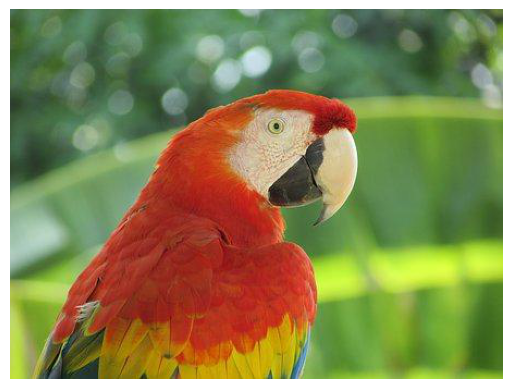

In [ ]:
im = Image.open("images/parrot.png") # read the image, provide the correct path
print(im.width, im.height, im.mode, im.format, type(im)) # width and height of the image , the mode of the image (RGB, L, etc.), the format of image(PNG, JPEG, etc.), type of the image object
# 453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>
im.show() # display the image
plt.axis('off') #hide the axis labels for clean view
plt.imshow(im)

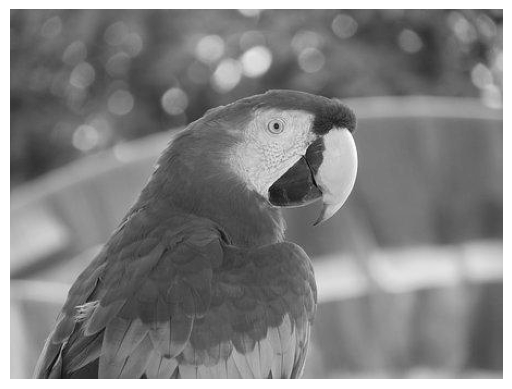

In [39]:
#L stands for luminance (singel-channel mode) converts the image to grayscale
im_g = im.convert('L') # convert the RGB color image to a grayscale image
im_g.save('images/parrot_gray.png') # save the image to disk
Image.open("images/parrot_gray.png").show() # read the grayscale image from disk and show
plt.axis('off')
plt.imshow(im_g)

Reading, saving, and displaying an image using Matplotlib

(960, 1280, 4) float32 <class 'numpy.ndarray'>


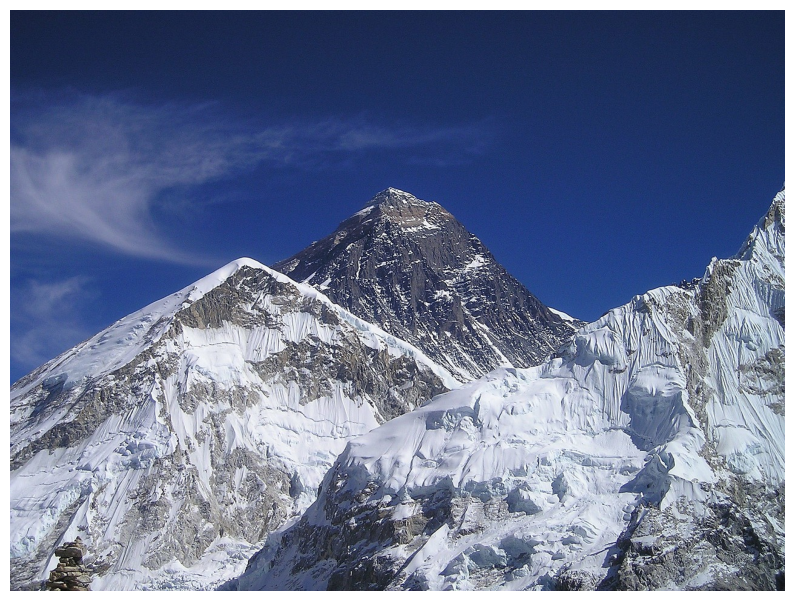

In [40]:
im = mpimg.imread("images/hill.png") # read the image from disk as a numpy ndarray
print(im.shape, im.dtype, type(im)) # this image contains an αlpha channel, hence num_channels= 4
# (960, 1280, 4) float32 <class 'numpy.ndarray'>
plt.figure(figsize=(10,10)) #matplotlib creates a new figure (plot) with 10x10 dimensions
plt.imshow(im) # display the image
plt.axis('off')
plt.show()

Details on extra channel:
    Simply to make things one step more confusing, some image files (notably, like PNG) contain more image information in an extra channel. This channel is essentially no different than an RGB or CMYK channel, with 256 shades of gray representing the image areas. However, Alpha channels have on crucial difference: they denote transparency, not color information.

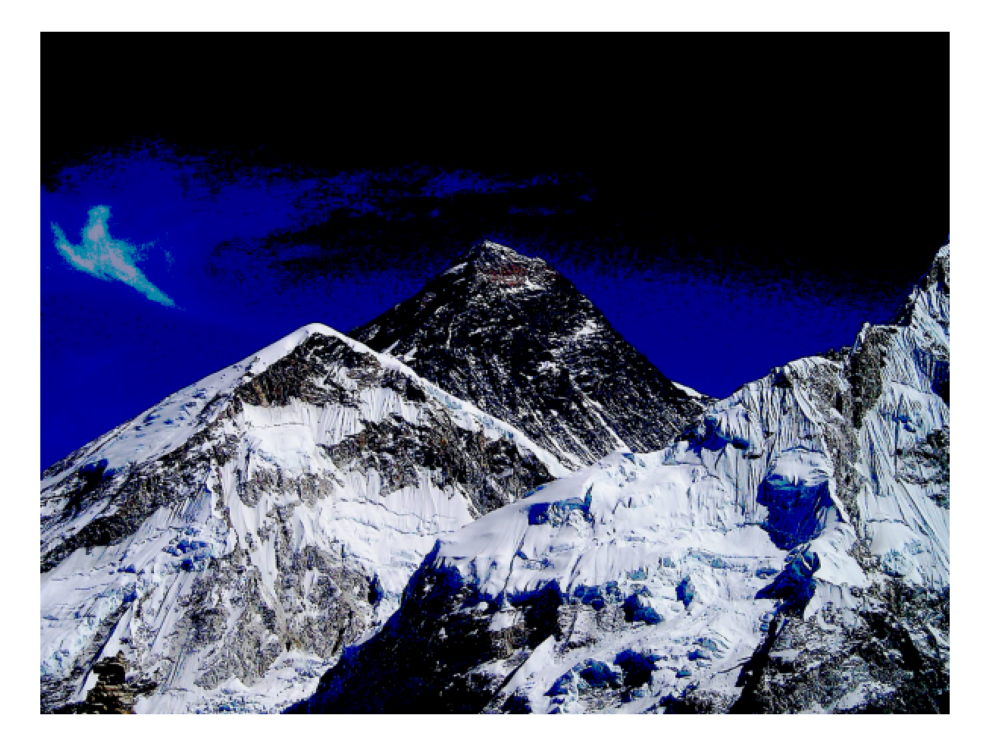

In [ ]:
im1 = im
# it makes the image look darker by setting pixel values less than 0.5 to 0, image's pixel values are typically normalized between 0 to 1 for the images loaded with matplotloib
# hence the operations reduces the brightness of the image by turning all the pixel less than 0.5 to 0 i.e. black
im1[im1 < 0.5] = 0 # make the image look darker  # explain ???
plt.imshow(im1)
plt.axis('off')
plt.tight_layout() #adjust the layout to ensure the image fits within the figure without any extra space
plt.savefig("images/hill_dark.png") # save the dark image
plt.close()
im = mpimg.imread("images/hill_dark.png") # read the dark image
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.axis('off') # no axis ticks
plt.tight_layout()
plt.show()

### Understanding color channels, RGB, CMYK and HSV
color channels: It is used to represent the individual component of the color model. Each channel is used to sotre the intensity value for a specific color, and combining these channels forma a full-color image.

RGB - This model has three colors channels: red, green and blue, each pixel in RGB image has three values . The image is composed of three images one for each channel.If RCB image is 24bit each channel has 8 bits. Each pixel in image has intensity from 0 to 255. It's an addititve color model.

CMYK - This model has 4 channels: cyan, magenta, yellow and key(black), the image is 32bit and each channel is made of 8bit channels. It is used in printing. It's an subtractive color model.

HSV - This model has three channels: Hue, saturation and value. The value channel denotes the brightness and other channel have the color information.

(340, 453, 3) uint8 <class 'numpy.ndarray'>


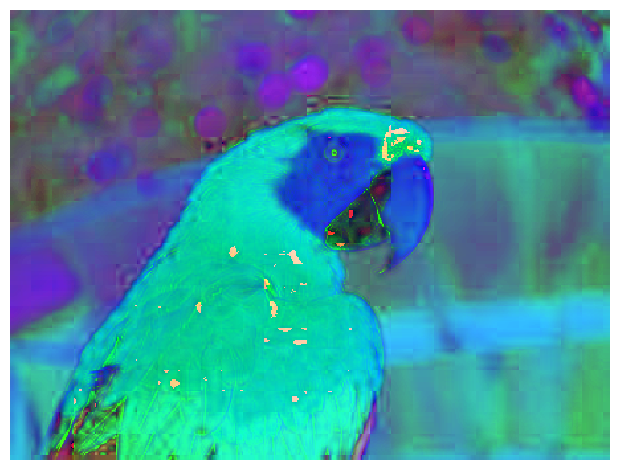

((0.0, 1.0, 0.0, 1.0), <matplotlib.image.AxesImage at 0x15e08e90bc0>, None)

In [71]:
im = imread("images/parrot.png") # read image from disk, provide the correct path
print(im.shape, im.dtype, type(im))
# Convert the RGB image to HSV
image_hsv = color.rgb2hsv(im) #https://www.geeksforgeeks.org/hsv-color-model-in-computer-graphics/

# Display the HSV image

plt.axis('off'), imshow(image_hsv), show()

<Figure size 640x480 with 0 Axes>

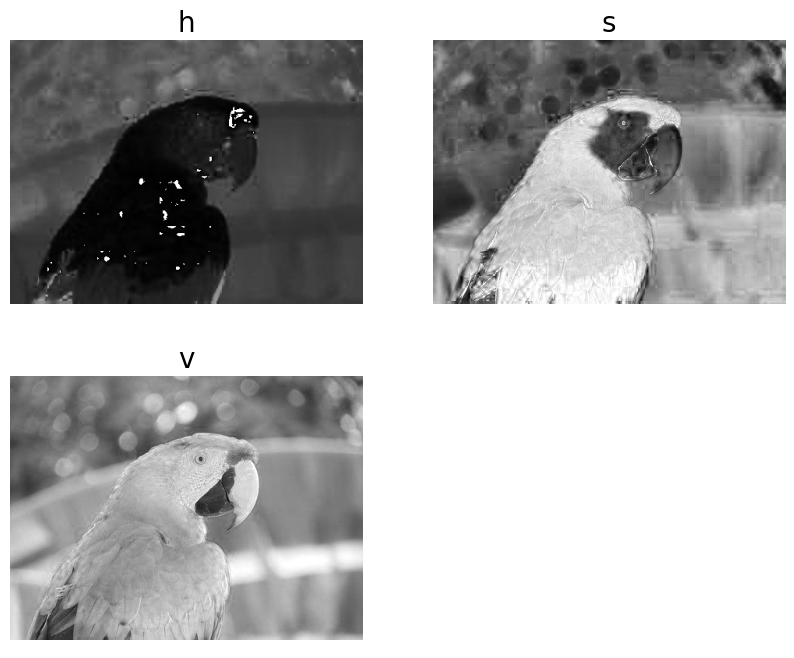

In [ ]:
im = imread("images/parrot.png")
im_hsv = color.rgb2hsv(im) # convert image rgb channel to hsv channel
plt.gray() #set colormap to grayscale for better visibility of individual channel
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im_hsv[...,0]), plt.title('h', size=20), #plot the hue channel 
plt.axis('off')
plt.subplot(222), plt.imshow(im_hsv[...,1]), plt.title('s', size=20), #plot the saturation channel
plt.axis('off')
plt.subplot(223), plt.imshow(im_hsv[...,2]), plt.title('v', size=20), #plot the value channel
plt.axis('off')
plt.subplot(224), plt.axis('off')
plt.show()

Converting from one file format to another

In [ ]:
im = Image.open("images/parrot.png") #open the image file
print(im.mode) #print the mode of the image
im.save("images/parrot.jpg") #save the image in the jpg format

RGB


In [ ]:
im = Image.open("images/hill.png")
print(im.mode)
# RGBA
im.convert('RGB').save("images/hill.jpg") # convert to RGB mode

RGBA


Converting from one image mode into another

(340, 453)


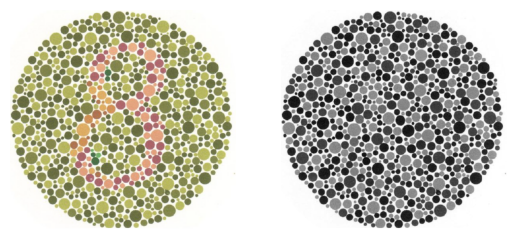

In [ ]:
im = imread("images/parrot.png", as_gray=True) #reda the image in grayscale(convert the image to 2D)
print(im.shape) #print the shape of the image
im = imread("images/Ishihara.png") #read the image in original format
im_g = color.rgb2gray(im) #convert rgb to grayscale
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(im_g, cmap='gray'), plt.axis('off')
plt.show()

Image manipulations with PIL

In [12]:
im = Image.open("images/parrot.png") # open the image, provide the correct path
print(im.width, im.height, im.mode, im.format) # print image size, mode and format

453 340 RGB PNG


Cropping an image

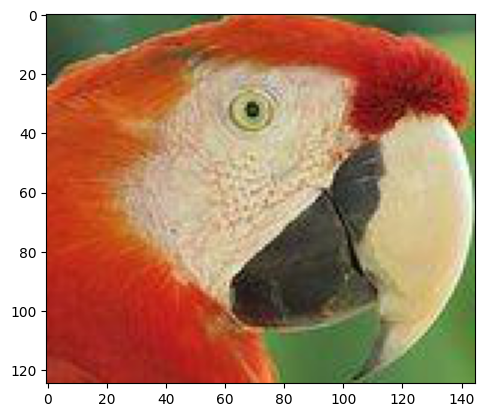

In [33]:
im_c = im.crop((175,75,320,200)) # crop the rectangle given by (left, top, right, bottom) from the image
im_c.show()
plt.imshow(im_c)

Resizing an image

107 105


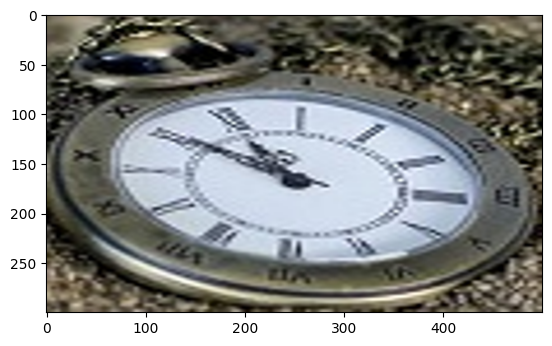

In [42]:
im = Image.open("images/clock.jpg")
print(im.width, im.height) #print the original height and width of the image
#im.show()
im_resized = im.resize((500, 300)) #resize the width and height
plt.imshow(im_resized)

Negating an image

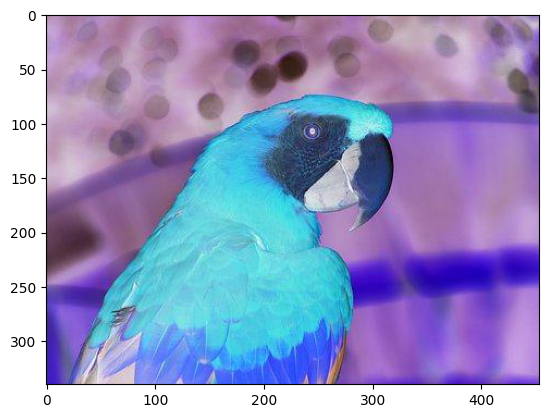

In [43]:
im = Image.open("images/parrot.png")
im_t = im.point(lambda x: 255 - x) #invert the image colors by using the 'point' method, lamba function subtracts each pixel value from 255 to invert the color of the image
im_t.show()
plt.imshow(im_t)

Reflecting an image

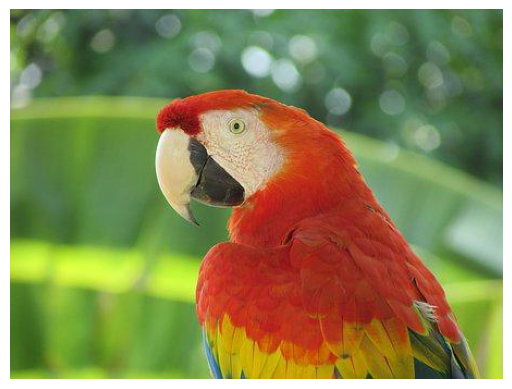

In [46]:
im_trans = im.transpose(Image.FLIP_LEFT_RIGHT) # reflect about the vertical axis (flipping the image horizontally)
plt.axis('off')
plt.imshow(im_trans) 

Rotating an image

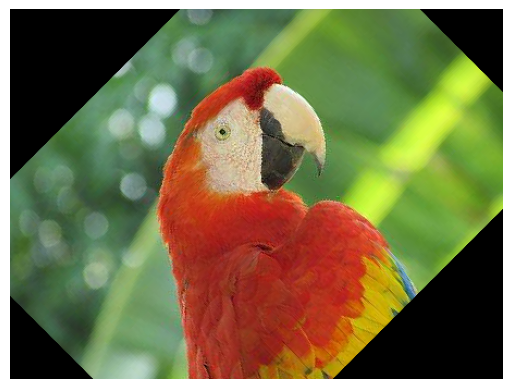

In [47]:
im_45 = im.rotate(45) # rotate the image by 45 degrees
im_45.show() # show the rotated image
plt.axis('off')
plt.imshow(im_45) 

Applying an Affine transformation on an image

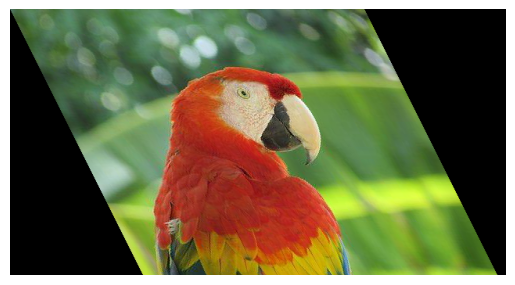

In [54]:
im = Image.open("images/parrot.png")
# width is scaled 1.4 times, shear factor of -0.5 is applied horizontally
im_shear = im.transform((int(1.4*im.width), im.height), Image.AFFINE,data=(1,-0.5,0,0,1,0))# shear
plt.axis('off')
plt.imshow(im_shear)

Changing pixel values of an image

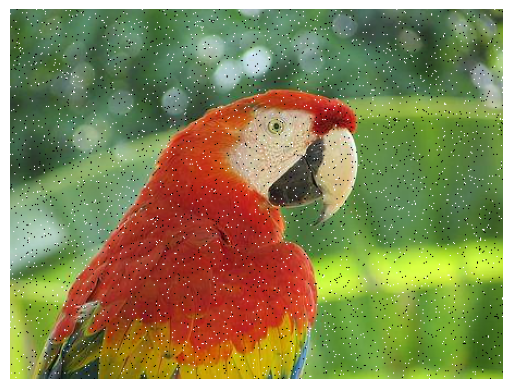

In [65]:
# choose 5000 random locations inside image
im1 = Image.open("images/parrot.png") # keep the original image, create a copy
n = 5000 #number of random pixels to modify
x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height,n) # generate n random x and y corridnates
for (x,y) in zip(x,y):
    im1.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # salt-and-pepper noise
plt.axis('off')
plt.imshow(im1)
im1.show()

Drawing on an image

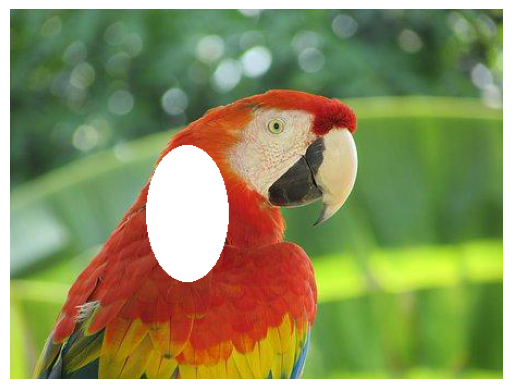

In [56]:
im = Image.open("images/parrot.png")
draw = ImageDraw.Draw(im) #create a drawing object to draw on the image
draw.ellipse((125, 125, 200, 250), fill=(255,255,255,128)) # draw a ellipse
#del draw
im.show()
plt.axis('off')
plt.imshow(im)

Drawing text on an image

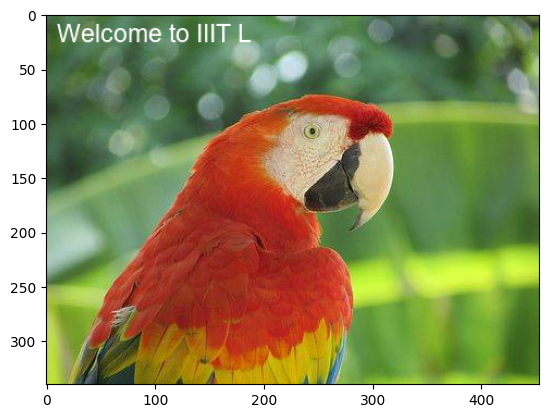

In [ ]:
im = Image.open("images/parrot.png")
draw = ImageDraw.Draw(im)
font = ImageFont.truetype("arial.ttf", 23) # use a truetype font for text rendering
draw.text((10, 5), "Welcome to IIIT L", font=font) # add the give font at the position(10,5)
del draw
plt.imshow(im)


Computing the basic statistics of an image

In [22]:
s = stat.Stat(im)
print(s.extrema) # maximum and minimum pixel values for each channel R, G, B
print(s.count)
print(s.mean)
print(s.median)
print(s.stddev)

[(0, 255), (0, 255), (0, 255)]
[154020, 154020, 154020]
[126.34679911699779, 125.1076353720296, 69.38413193091806]
[118, 128, 63]
[48.349042716945405, 51.949523238285074, 41.29687109521141]


Plotting the histograms of pixel values for the RGB channels of an image

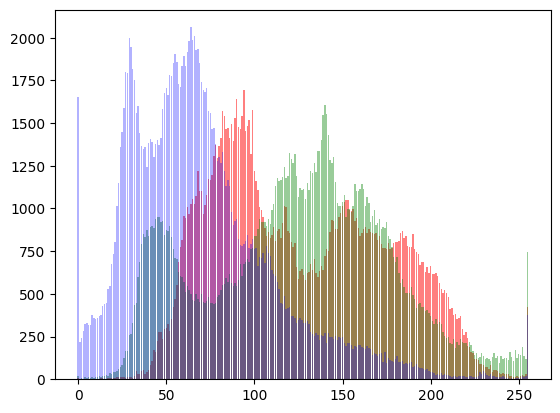

In [ ]:
pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5) #plot for the red channel
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4) #plot for the green channel
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3) #plot for the blue channel
plt.show()

Separating the RGB channels of an image

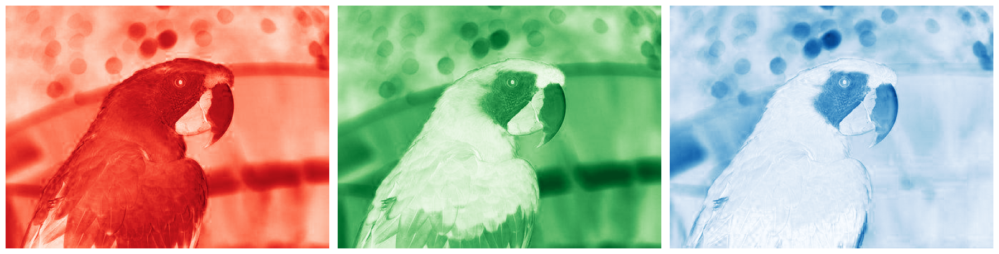

In [ ]:
im = Image.open("images/parrot.png")
ch_r, ch_g, ch_b = im.split() # split the RGB image into 3 channels: R, G and B
# we shall use matplotlib to display the channels
plt.figure(figsize=(18,6))
plt.subplot(1,3,1); plt.imshow(ch_r, cmap=plt.cm.Reds); plt.axis('off') #red color map
plt.subplot(1,3,2); plt.imshow(ch_g, cmap=plt.cm.Greens); plt.axis('off') #green color map
plt.subplot(1,3,3); plt.imshow(ch_b, cmap=plt.cm.Blues); plt.axis('off') #blue color map
plt.tight_layout()
plt.show() # show the R, G, B channels

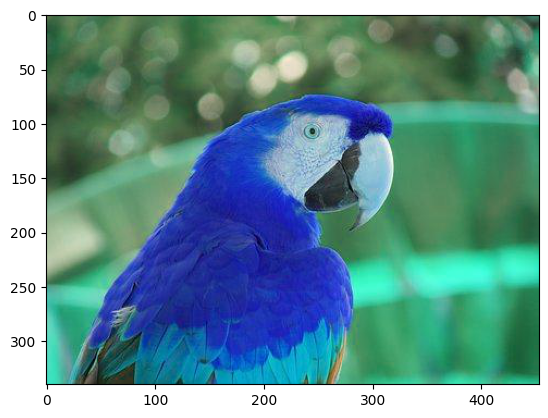

In [66]:
im = Image.merge('RGB', (ch_b, ch_g, ch_r)) # swap the red and blue channels obtained last time with split()
plt.imshow(im)
im.show()

Superimposing two images

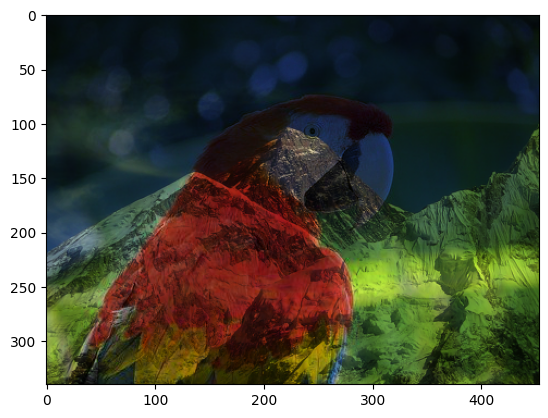

In [ ]:
im1 = Image.open("images/parrot.png")
im2 = Image.open("images/hill.png").convert('RGB').resize((im1.width, im1.height)) # resize the second image in the dimensions of first image
# multiplication generally darkens the resulting image
mult = multiply(im1, im2)
plt.imshow(mult)

Adding two images

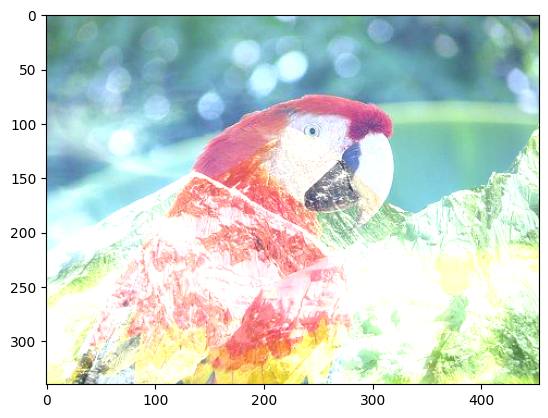

In [70]:
#addition increases the brightness of the image where the pixel values are added
im_add = add(im1, im2)
plt.imshow(im_add)

Computing the difference between two images

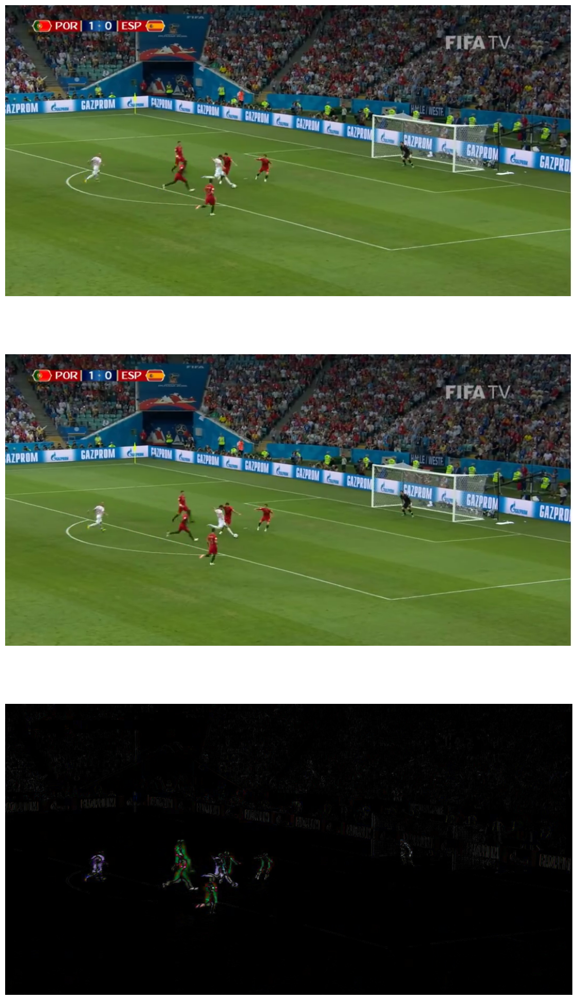

In [ ]:
from PIL.ImageChops import subtract, multiply, screen, difference, add
im1 = Image.open("images/goal1.png") # load two consecutive frame images from the video
im2 = Image.open("images/goal2.png")
im = difference(im1, im2) # calculate the pixel wise difference between the images
plt.figure(figsize=(20,25))
im.save("images/goal_diff.png")
plt.subplot(311)
plt.imshow(im1)
plt.axis('off')
plt.subplot(312)
plt.imshow(im2)
plt.axis('off')
plt.subplot(313)
plt.imshow(im), plt.axis('off')
plt.show()
## The resultant image shows the difference between the two consecutive frame of a video, which are not distinguishable by human eye. Hence here we used the subtraction method for 
## finding this difference, this is a good application of cv and can be used in finding a moving obsjects or cctv footage checking.